# GANS2

## Imports

In [4]:

import kagglehub
import os
import torch
from torch import nn
import torchvision
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms as T
from PIL import Image
import sklearn
from sklearn.model_selection import train_test_split

## Loading Data from Kaggle

In [5]:
path = kagglehub.dataset_download("jessicali9530/celeba-dataset")
img_dir = os.path.join(path, "img_align_celeba", "img_align_celeba")

Using Colab cache for faster access to the 'celeba-dataset' dataset.


In [6]:
class CelebASubset(Dataset):
    def __init__(self, img_dir, num_images=10000, transform=None):
        self.img_dir = img_dir
        self.transform = transform

        todas_imagens = os.listdir(img_dir)
        self.images = todas_imagens[:num_images]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image

## Transformers

In [7]:
imgsize = 64
transform = T.Compose([
    T.Resize(size=(imgsize,imgsize)),
    T.ToTensor()
    ]
)

## Hyperparameters

In [8]:
batch_size = 16
shuffle = True
dis_lr = 2e-04
gen_lr = 3e-05
device = 'cuda' if torch.cuda.is_available() else 'cpu'
latent_dim = 128
epochs = 100
torch.manual_seed(42)

## Loading Dataset and Transform into Tensor

In [9]:
dataset = CelebASubset(img_dir, transform=transform)
dataset[0].shape # Shape: (3,64,64) -> 3 colors Channel (RGB), 64 Height, 64 Widht

torch.Size([3, 64, 64])

In [10]:
dataloader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=shuffle)

## Generator & Discriminator

In [11]:
class Generator(nn.Module):
  # the ideia is reduce the number of filters of each "layers", for example, the first part have 512 filters and a 4x4 image, the second have 256 filters and a 8x8 image, the name of it is Upsampling
  def __init__(self, n_in):
    super(Generator, self).__init__()

    self.layers1 = nn.Sequential(
        nn.Linear(in_features=n_in, out_features=4*4*512),
        nn.BatchNorm1d(num_features=4*4*512),
        nn.ReLU(),
        nn.Dropout(p=0.3)
    )

    self.layers2 = nn.Sequential(
        nn.ConvTranspose2d(in_channels=512,out_channels=256, stride = 2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(num_features=256),
        nn.ReLU(),
        nn.ConvTranspose2d(in_channels=256,out_channels=128, stride=2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(num_features=128),
        nn.ReLU(),
        nn.ConvTranspose2d(in_channels=128, out_channels=64, stride=2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.ConvTranspose2d(in_channels=64, out_channels=3,kernel_size=(4,4), stride = 2, padding = 1),
        nn.Tanh() #Returns values  between -1 and 1
    )

  def forward(self,x):
    arr = self.layers1(x)
    matrix = arr.view(-1,512,4,4) #reorganize the data into a cube with dimensions 512*4*4 -> is necessary
    l = self.layers2(matrix)
    return l

In [12]:
class Discriminator(nn.Module):
  # Here we do a DownSample because we are increasing the number of filters (analysed features) and reducing the size of the image, first "iteration" 64 filters (RGB) and 64x64px -> 128 filters 32*32px
  def __init__(self):
    super(Discriminator, self).__init__()
    self.layers = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=64, stride = 2, kernel_size=(4,4), padding = 1), # 64x64 -> 32x32 in the Conv2d the stride reduces the size of the image by the parameter and the increse of the channels is, we are reducing the size of the image but getting more filters (informations) of the image
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),
        nn.Conv2d(in_channels=64, out_channels=128, stride = 2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),
        nn.Conv2d(in_channels=128, out_channels=256, stride = 2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3),
        nn.Conv2d(in_channels=256, out_channels=512, stride = 2, kernel_size=(4,4), padding = 1),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2),
        nn.Dropout(0.3)
    )

    self.sigmoid = nn.Sigmoid()
    self.flatten = nn.Flatten()
    self.final = nn.Linear(4*4*512,1)

  def forward(self, image):
    l = self.layers(image)
    l = self.flatten(l)
    l = self.final(l)
    return self.sigmoid(l)


In [13]:
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)

## Otimizadores e Loss Function

In [14]:
loss_func = nn.BCELoss()
gen_optim = torch.optim.Adam(generator.parameters(), lr = gen_lr, betas = (0.5, 0.999))
dis_optim = torch.optim.Adam(discriminator.parameters(), lr = dis_lr, betas = (0.5, 0.999))

In [15]:
def real_data_target(size, device = device):
  return torch.ones(size,1).to(device)

def fake_data_target(size, device = device):
  return torch.zeros(size,1).to(device)

def noise(size = batch_size, dim = latent_dim, devive = device):
  return torch.randn(batch_size,latent_dim).to(device)

## Treinamento das Redes

In [16]:
def train_discriminator(real_data, fake_data, loss_func, optmizer):
  discriminator.train()
  optmizer.zero_grad()
  # For real data
  pred_real = discriminator(real_data)
  loss_real = loss_func(pred_real, real_data_target(real_data.size(0)))
  loss_real.backward()
  # For fake data
  pred_fake = discriminator(fake_data)
  loss_fake = loss_func(pred_fake, fake_data_target(fake_data.size(0)))
  loss_fake.backward()

  optmizer.step()

  return loss_real + loss_fake, pred_real, pred_fake

def train_generator(fake_data, loss_func, optmizer):
  generator.train()
  optmizer.zero_grad()
  pred_fake = discriminator(fake_data)
  loss_fake = loss_func(pred_fake, real_data_target(pred_fake.size(0))) #we want that the discriminator says that the data is real!!!!
  loss_fake.backward()
  optmizer.step()

  return loss_fake, pred_fake

In [17]:
import matplotlib.pyplot as plt

def test_and_plot(epoch):
  with torch.no_grad():
    generator.eval()
    fake_img = generator(noise()).detach().cpu()
    fake_img = (fake_img + 1)/2
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(8, 8))
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.suptitle(f"Fake Data - Epoch {epoch}", fontsize=16)
    for i, ax in enumerate(axes.flatten()):
      img = fake_img[i].permute(1, 2, 0).numpy()
      ax.imshow(img)
      ax.axis("off")

    plt.show()


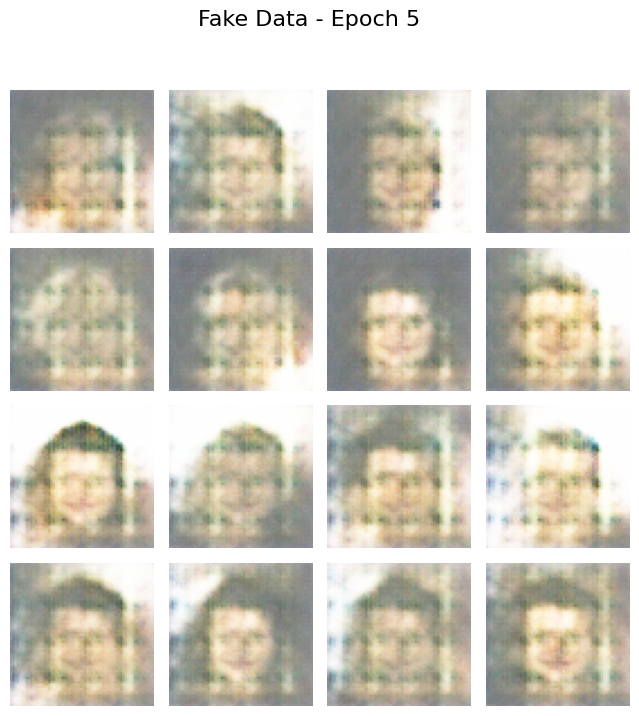

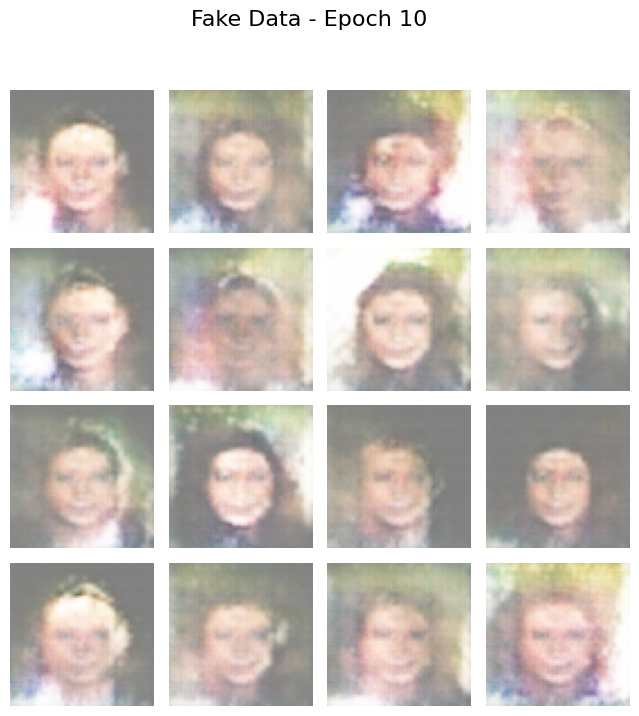

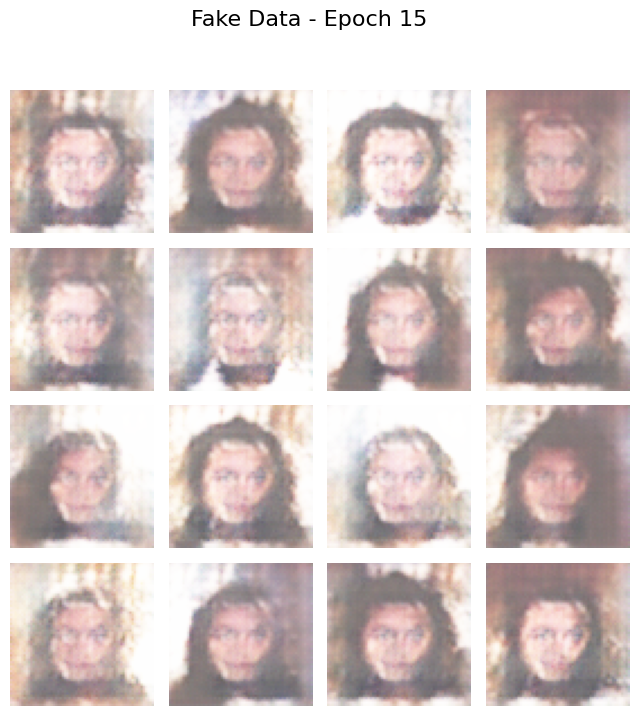

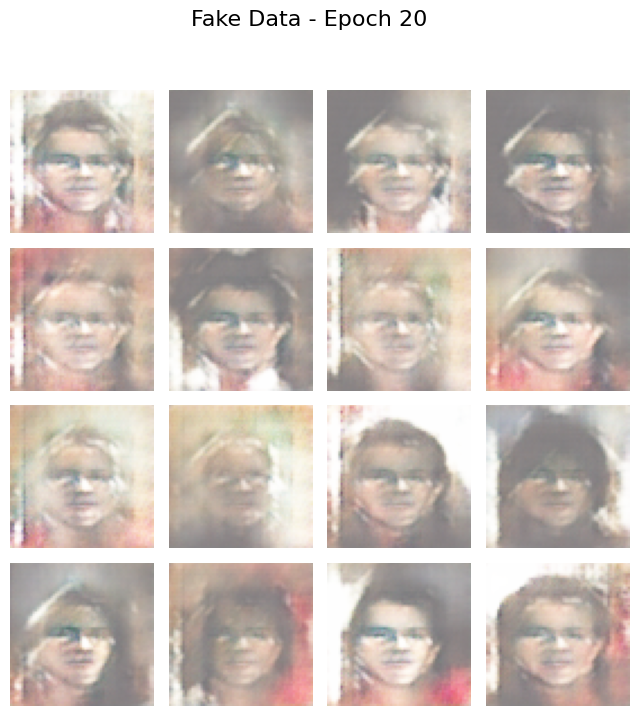

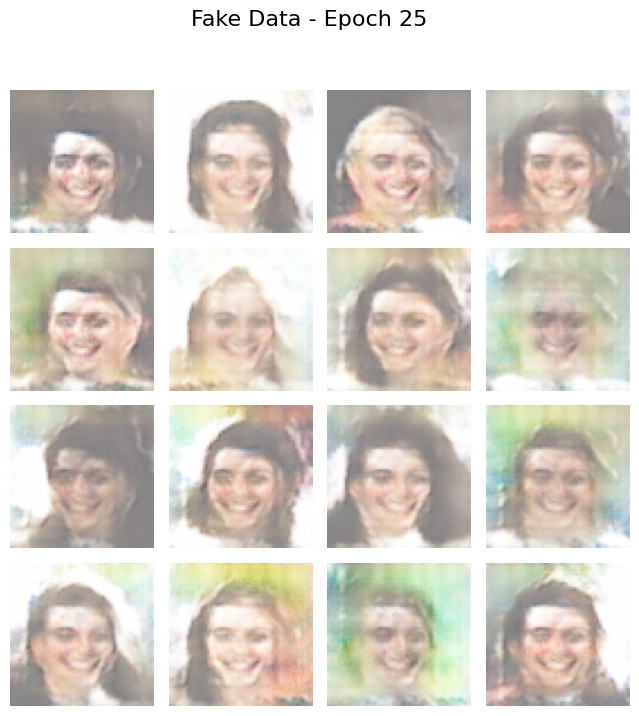

...

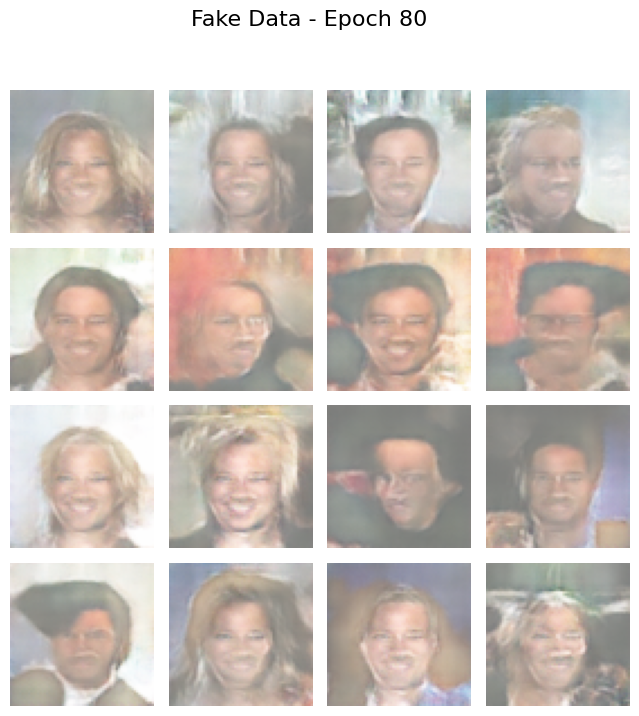

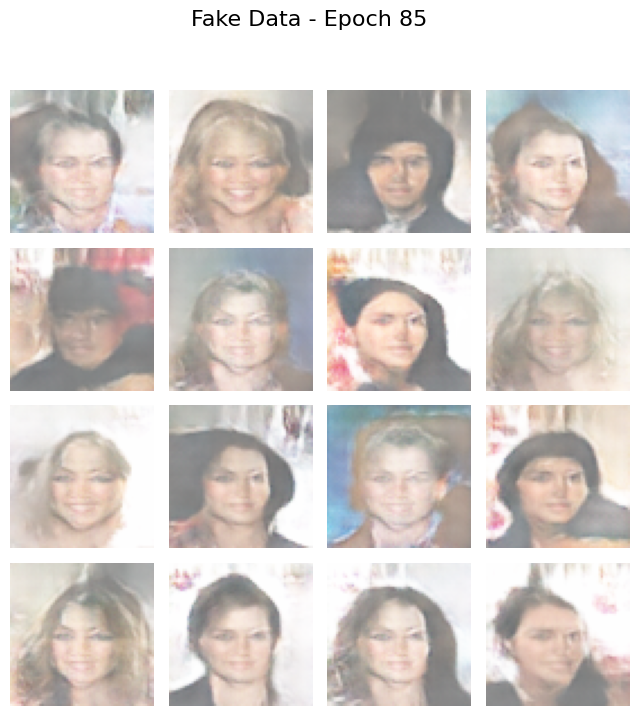

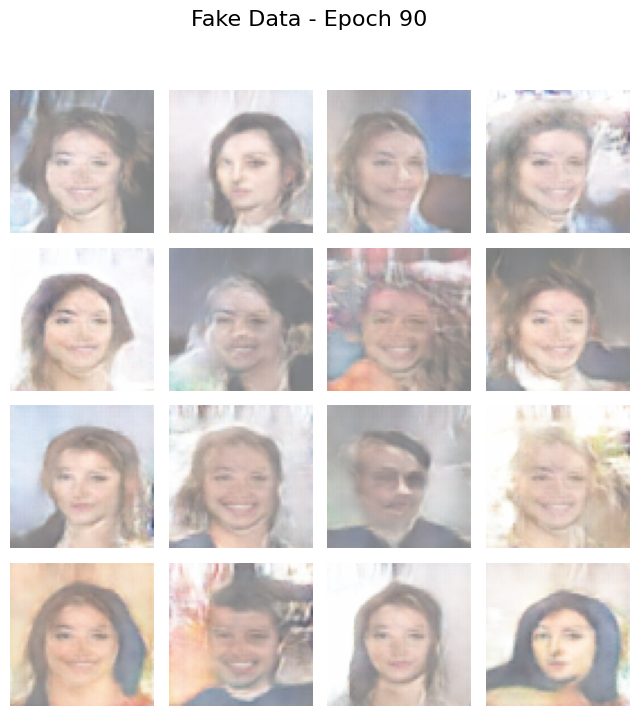

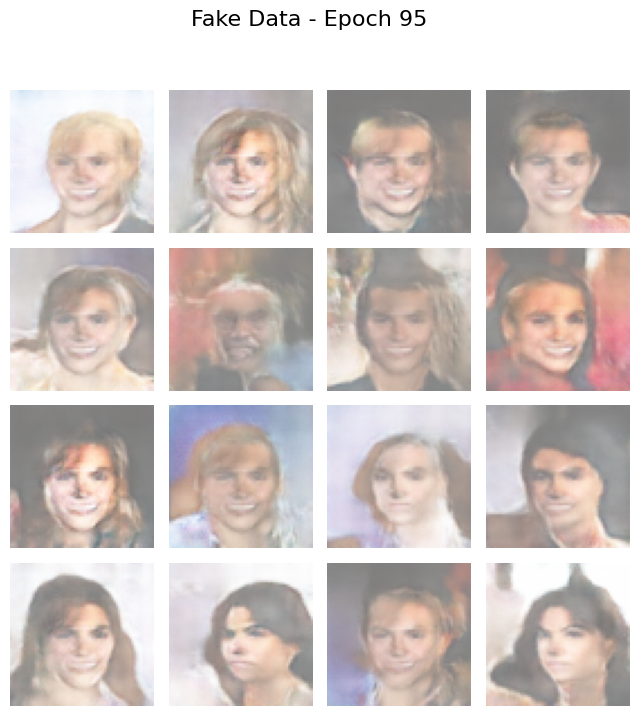

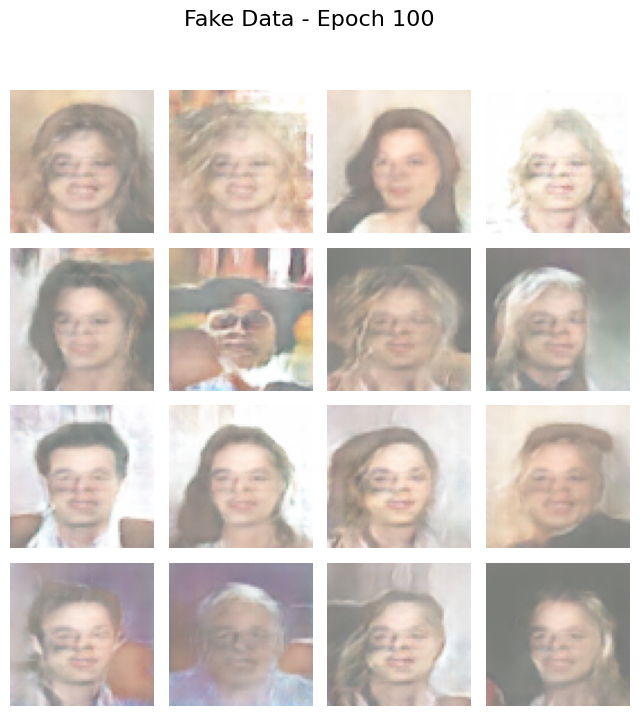

In [18]:
# Building the Epochs looping

for i in range(1,epochs+1):
  for img in dataloader:
    real_data = img.to(device)
    # Train the first time the discriminator
    dis_fake_data = generator(noise()).detach()
    loss_dis, pred_real_dis, pred_fake_dis = train_discriminator(real_data,dis_fake_data,loss_func,dis_optim)
    # Train the first time the generator
    gen_fake_data = generator(noise())
    loss_gen, pred_fake_gen = train_generator(gen_fake_data,loss_func, gen_optim)
    # Train the second time the generator
    gen_fake_data2 = generator(noise())
    loss_gen2, pred_fake_gen2 = train_generator(gen_fake_data2, loss_func, gen_optim)
  if(i % 5 == 0):
    test_and_plot(i)